In [1]:
import pandas as pd
import seaborn as sns
import re
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

In [2]:
id_season = {
        578: 2023,
        489: 2022,
        418: 2021,
        363: 2020,
        274: 2019,
        210: 2018,
        79: 2017,
        54: 2016,
        42: 2015,
        27: 2014,
        22: 2013,
        21: 2012,
        20: 2011,
        19: 2010,
        18: 2009,
        17: 2008,
        16: 2007,
        15: 2006,
        14: 2005,
        13: 2004,
        12: 2003,
        11: 2002,
        10: 2001,
        9: 2000,
        8: 1999,
        7: 1998,
        6: 1997,
        5: 1996,
        4: 1995,
        3: 1994,
        2: 1993,
        1: 1992}

In [3]:
path = '../../parsers/official/data/player_stat.csv'
df = pd.read_csv(Path(path).resolve())
pd.set_option('display.max_columns', None)
df.head()

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,nationalTeam_isoCode,nationalTeam_country,nationalTeam_demonym,birth_date_millis,birth_date_label,birth_country_isoCode,birth_country_country,birth_country_demonym,birth_place,age,name_display,name_first,name_middle,name_last,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card
0,578,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,24 years 153 days,Max Aarons,Max,James,Aarons,19970.0,185.0,18.0,3.0,3.0,164.0,3.0,20.0,346.0,1.0,101.0,11.0,5.0,20.0,8.0,148.0,67.0,2.0,6.0,1.0,1.0,2.0,2.0,102.0,75.0,1.0,6.0,4.0,1.0,14.0,1.0,9.0,4.0,8.0,4.0,57.0,74.0,6.0,21.0,3.0,60.0,6.0,12.0,178.0,13.0,34.0,30.0,4.0,3.0,29.0,8.0,1.0,8.0,129.0,56.0,32.0,12.0,12.0,1234.0,3.0,2.0,5.0,440.0,5.0,4.0,13.0,128.0,1.0,30.0,2.0,168.0,168.0,5.0,48.0,22.0,27.0,42.0,87.0,335.0,4.0,20.0,7.0,231.0,41.0,21.0,26.0,13.0,13.0,128.0,2.0,233.0,18.0,51.0,2.0,451.0,1.0,2.0,4.0,7.0,29.0,2.0,116.0,751.0,12.0,13.0,13.0,26.0,0.0,4.0,14.0,2.0,19.0,1.0
1,418,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,24 years 153 days,Max Aarons,Max,James,Aarons,19970.0,461.0,23.0,9.0,9.0,395.0,10.0,36.0,847.0,2.0,251.0,50.0,14.0,34.0,5.0,336.0,179.0,6.0,17.0,8.0,1.0,6.0,13.0,219.0,154.0,2.0,25.0,60.0,6.0,18.0,4.0,33.0,17.0,23.0,6.0,151.0,163.0,25.0,71.0,32.0,134.0,6.0,27.0,456.0,32.0,69.0,62.0,7.0,32.0,47.0,28.0,4.0,28.0,367.0,157.0,71.0,24.0,39.0,2882.0,15.0,10.0,10.0,1080.0,19.0,13.0,11.0,335.0,2.0,93.0,6.0,470.0,470.0,5.0,110.0,39.0,60.0,55.0,211.0,833.0,20.0,57.0,20.0,555.0,80.0,71.0,68.0,50.0,50.0,308.0,2.0,592.0,67.0,141.0,1.0,1097.0,1.0,13.0,3.0,2.0,64.0,5.0,315.0,1962.0,26.0,38.0,38.0,52.0,0.0,4.0,34.0,12.0,44.0,8.0
2,274,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,24 years 153 days,Max Aarons,Max,James,Aarons,19970.0,570.0,23.0,16.0,16.0,502.0,12.0,38.0,1056.0,NaN,260.0,50.0,22.0,36.0,12.0,384.0,188.0,3.0,22.0,3.0,2.0,3.0,13.0,352.0,178.0,7.0,24.0,82.0,6.0,18.0,5.0

In [4]:
df[df['info_position'] == 'G']

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,nationalTeam_isoCode,nationalTeam_country,nationalTeam_demonym,birth_date_millis,birth_date_label,birth_country_isoCode,birth_country_country,birth_country_demonym,birth_place,age,name_display,name_first,name_middle,name_last,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card
11,363,161346.0,G,13.0,Goalkeeper,False,ES,Spain,Spanish,5.366304e+11,3 January 1987,ES,Spain,Spanish,Sevilla,37 years 154 days,Adrián,Adrián,NaN,San Miguel del Castillo,4852.0,54.0,5.0,NaN,NaN,6.0,4.0,10.0,60.0,NaN,NaN,NaN,1.0,3.0,NaN,24.0,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN,1.0,NaN,6.0,NaN,5.0,NaN,NaN,32.0,3.0,9.0,7.0,2.0,NaN,NaN,NaN,NaN,NaN,26.0,19.0,6.0,1.0,4.0,270.0,NaN,NaN,NaN,50.0,NaN,NaN,5.0,3.0,NaN,NaN,NaN,22.0,22.0,NaN,2.0,NaN,NaN,22.0,NaN,36.0,NaN,0.0,NaN,61.0,7.0,6.0,NaN,NaN,NaN,5.0,NaN,19.0,17.0,27.0,NaN,80.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,116.0,NaN,NaN,NaN,NaN,0.0,1.0,NaN,NaN,NaN,NaN
12,274,161346.0,G,13.0,Goalkeeper,False,ES,Spain,Spanish,5.366304e+11,3 January 1987,ES,Spain,Spanish,Sevilla,37 years 154 days,Adrián,Adrián,NaN,San Miguel del Castillo,4852.0,174.0,24.0,NaN,NaN,13.0,10.0,50.0,187.0,NaN,NaN,NaN,4.0,11.0,NaN,58.0,35.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.0,NaN,NaN,1.0,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,6.0,NaN,12.0,1.0,12.0,NaN,NaN,132.0,9.0,10.0,8.0,2.0,1.0,1.0,NaN,NaN,NaN,62.0,61.0,13.0,NaN,4.0,873.0,0.0,NaN,NaN,152.0,NaN,NaN,13.0,12.0,NaN,0.0,NaN,73.0,73.0,NaN,5.0,NaN,1.0,66.0,3.0,109.0,NaN,0.0,NaN,199.0,40.0,12.0,NaN,NaN,NaN,12.0,NaN,61.0,47.0,121.0,NaN,260.0,NaN,NaN,NaN,2.0,1.0,NaN,NaN,354.0,NaN,NaN,NaN,1.0,0.0,11.0,NaN,NaN,1.0,1.0
13,79,161346.0,G,13.0,Goalkeeper,False,ES,Spain,Spanish,5.366304e+11,3 January 1987,ES,Spain,Spanish,Sevilla,37 years 154 days,Adrián,Adrián,NaN,San Miguel del Castillo,4852.0,91.0,11.0,NaN,NaN,130.0,54.0,174.0,221.0,NaN,0.0,1.0,3.0,19.0,1.0,171.0,140.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,180.0,NaN,NaN,1.0,NaN,3.0,6.0,NaN,NaN,NaN,6.0,5.0,7.0,NaN,21.0,0.0,103.0,NaN,1.0,472.0,19.0,29.0,23.0,6.0,0.0,NaN,0.0,0.0,0.0,29.0,382.0,130.0,6.0,16.0,1710.0,NaN,NaN,NaN,201.0,0.0,NaN

In [5]:
df.shape

(2490, 133)

In [6]:
#Удаляем колонки в которых информация дублируется либо информация бесполезна
df.drop(['nationalTeam_isoCode',
         'nationalTeam_demonym',
         'nationalTeam_country', 
         'birth_country_isoCode', 
         'birth_country_demonym',
         'birth_date_millis',
         'name_first',
         'name_middle',
         'name_last'
         ], axis=1, inplace=True)

In [7]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2490 entries, 0 to 2489
Data columns (total 124 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    season_id                       2490 non-null   int64  
 1    playerId                        2490 non-null   float64
 2    info_position                   2490 non-null   object 
 3    info_shirtNum                   2252 non-null   float64
 4    info_positionInfo               2490 non-null   object 
 5    info_loan                       2490 non-null   bool   
 6    birth_date_label                2490 non-null   object 
 7    birth_country_country           2490 non-null   object 
 8    birth_place                     1630 non-null   object 
 9    age                             2490 non-null   object 
 10   name_display                    2490 non-null   object 
 11   id                              2490 non-null   float64
 12   _accurate_back_zon

In [8]:
col = df.columns
for i in col:
    if df[i].dtypes == float:
        print(f'{i}: mean: {int(df[i].mean())}, min: {df[i].min()}, max: {df[i].max()}, na: {df[i].isna().sum()}')

playerId: mean: 261599, min: 6011.0, max: 358671.0, na: 0
info_shirtNum: mean: 17, min: 1.0, max: 98.0, na: 238
id: mean: 22749, min: 2100.0, max: 145135.0, na: 0
_accurate_back_zone_pass: mean: 304, min: 0.0, max: 2111.0, na: 77
_accurate_chipped_pass: mean: 31, min: 0.0, max: 265.0, na: 257
_accurate_cross: mean: 10, min: 0.0, max: 135.0, na: 880
_accurate_cross_nocorner: mean: 7, min: 0.0, max: 70.0, na: 900
_accurate_fwd_zone_pass: mean: 323, min: 0.0, max: 2122.0, na: 72
_accurate_launches: mean: 10, min: 0.0, max: 219.0, na: 771
_accurate_long_balls: mean: 48, min: 0.0, max: 410.0, na: 245
_accurate_pass: mean: 613, min: 0.0, max: 3359.0, na: 48
_accurate_through_ball: mean: 2, min: 0.0, max: 23.0, na: 1475
_accurate_throws: mean: 37, min: 0.0, max: 460.0, na: 668
_aerial_lost: mean: 27, min: 0.0, max: 245.0, na: 276
_aerial_won: mean: 27, min: 0.0, max: 240.0, na: 249
_appearances: mean: 22, min: 0.0, max: 38.0, na: 18
_attempted_tackle_foul: mean: 11, min: 0.0, max: 70.0, na: 3

In [9]:
df['season'] = df['season_id'].apply(lambda x: id_season[x])

In [10]:
#Возраст у игрока в каждом сезоне одинаковый, исправим это
df['age'] = df['season'] - df['birth_date_label'].apply(lambda x: int(x.split()[-1]))

In [11]:
df.shape

(2490, 125)

In [12]:
#Удалим строки с большим количеством пропусков
"""df.dropna(thresh=62, inplace=True)
df.shape"""

'df.dropna(thresh=62, inplace=True)\ndf.shape'

In [13]:
#Удалим колонки, в которых  более 30% пропусков
"""df.dropna(thresh=1700, axis=1, inplace=True)
df.shape"""

'df.dropna(thresh=1700, axis=1, inplace=True)\ndf.shape'

In [14]:
df.columns

Index(['season_id', 'playerId', 'info_position', 'info_shirtNum',
       'info_positionInfo', 'info_loan', 'birth_date_label',
       'birth_country_country', 'birth_place', 'age',
       ...
       '_turnover', '_unsuccessful_touch', '_was_fouled', '_winning_goal',
       '_wins', '_won_contest', '_won_corners', '_won_tackle', '_yellow_card',
       'season'],
      dtype='object', length=125)

In [15]:
df[['_wins', '_losses', '_game_started', '_draws', '_appearances']] #appearances = wins + losses + draws

,_wins,_losses,_game_started,_draws,_appearances
0,4.0,12.0,13.0,4.0,20.0
1,4.0,24.0,32.0,6.0,34.0
2,4.0,26.0,36.0,6.0,36.0
3,1.0,NaN,NaN,NaN,1.0
4,2.0,1.0,1.0,NaN,3.0
...,...,...,...,...,...
2485,10.0,NaN,7.0,5.0,15.0
2486,26.0,4.0,35.0,5.0,35.0
2487,25.0,6.0,37.0,6.0,37.0
2488,22.0,11.0,32.0,3.0,36.0


In [16]:
df[['_wins', '_losses', '_game_started', '_draws', '_appearances']].isna().sum()

_wins            184
_losses          166
_game_started    243
_draws           293
_appearances      18
dtype: int64

In [17]:
df_temp = df[['_wins', '_losses', '_draws', '_appearances']]
df_temp['sum_'] = df_temp['_losses'].fillna(0) + df_temp['_draws'].fillna(0) + df_temp['_wins'].fillna(0)
df_temp

/tmp/ipykernel_59397/807101919.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp['sum_'] = df_temp['_losses'].fillna(0) + df_temp['_draws'].fillna(0) + df_temp['_wins'].fillna(0)


,_wins,_losses,_draws,_appearances,sum_
0,4.0,12.0,4.0,20.0,20.0
1,4.0,24.0,6.0,34.0,34.0
2,4.0,26.0,6.0,36.0,36.0
3,1.0,NaN,NaN,1.0,1.0
4,2.0,1.0,NaN,3.0,3.0
...,...,...,...,...,...
2485,10.0,NaN,5.0,15.0,15.0
2486,26.0,4.0,5.0,35.0,35.0
2487,25.0,6.0,6.0,37.0,37.0
2488,22.0,11.0,3.0,36.0,36.0


In [18]:
#Проверим гипотезу, что наны в этих колонка - нули
df_temp[df_temp['_appearances'] != df_temp['sum_']]

,_wins,_losses,_draws,_appearances,sum_
26,NaN,NaN,NaN,NaN,0.0
112,8.0,17.0,4.0,30.0,29.0
145,8.0,7.0,8.0,24.0,23.0
250,NaN,NaN,NaN,NaN,0.0
270,5.0,3.0,2.0,11.0,10.0
322,NaN,NaN,NaN,NaN,0.0
405,NaN,NaN,NaN,NaN,0.0
413,10.0,17.0,4.0,32.0,31.0
495,NaN,NaN,NaN,NaN,0.0
529,NaN,NaN,NaN,NaN,0.0


В нескольких строках наша гипотезу не подтвердилась, но разница везде в 1 матч, видимо это ошибка в данных. Но самое главное нет ни одной строки с нанами, которые мы заменили на нули, поэтому смело меняем наны в этих колонках на нули

In [19]:
df[['_wins', '_losses', '_draws', '_appearances']] = df[['_wins', '_losses', '_draws', '_appearances']].fillna(0)

In [20]:
df['per_wins'] = df['_wins'] / df['_appearances']

In [21]:
df[['_wins', '_losses', '_draws', '_appearances']].loc[4]

_wins           2.0
_losses         1.0
_draws          0.0
_appearances    3.0
Name: 4, dtype: float64

In [22]:
df.head()

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,birth_date_label,birth_country_country,birth_place,age,name_display,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
0,578,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,23,Max Aarons,19970.0,185.0,18.0,3.0,3.0,164.0,3.0,20.0,346.0,1.0,101.0,11.0,5.0,20.0,8.0,148.0,67.0,2.0,6.0,1.0,1.0,2.0,2.0,102.0,75.0,1.0,6.0,4.0,1.0,14.0,1.0,9.0,4.0,8.0,4.0,57.0,74.0,6.0,21.0,3.0,60.0,6.0,12.0,178.0,13.0,34.0,30.0,4.0,3.0,29.0,8.0,1.0,8.0,129.0,56.0,32.0,12.0,12.0,1234.0,3.0,2.0,5.0,440.0,5.0,4.0,13.0,128.0,1.0,30.0,2.0,168.0,168.0,5.0,48.0,22.0,27.0,42.0,87.0,335.0,4.0,20.0,7.0,231.0,41.0,21.0,26.0,13.0,13.0,128.0,2.0,233.0,18.0,51.0,2.0,451.0,1.0,2.0,4.0,7.0,29.0,2.0,116.0,751.0,12.0,13.0,13.0,26.0,0.0,4.0,14.0,2.0,19.0,1.0,2023,0.200000
1,418,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,21,Max Aarons,19970.0,461.0,23.0,9.0,9.0,395.0,10.0,36.0,847.0,2.0,251.0,50.0,14.0,34.0,5.0,336.0,179.0,6.0,17.0,8.0,1.0,6.0,13.0,219.0,154.0,2.0,25.0,60.0,6.0,18.0,4.0,33.0,17.0,23.0,6.0,151.0,163.0,25.0,71.0,32.0,134.0,6.0,27.0,456.0,32.0,69.0,62.0,7.0,32.0,47.0,28.0,4.0,28.0,367.0,157.0,71.0,24.0,39.0,2882.0,15.0,10.0,10.0,1080.0,19.0,13.0,11.0,335.0,2.0,93.0,6.0,470.0,470.0,5.0,110.0,39.0,60.0,55.0,211.0,833.0,20.0,57.0,20.0,555.0,80.0,71.0,68.0,50.0,50.0,308.0,2.0,592.0,67.0,141.0,1.0,1097.0,1.0,13.0,3.0,2.0,64.0,5.0,315.0,1962.0,26.0,38.0,38.0,52.0,0.0,4.0,34.0,12.0,44.0,8.0,2021,0.117647
2,274,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,19,Max Aarons,19970.0,570.0,23.0,16.0,16.0,502.0,12.0,38.0,1056.0,NaN,260.0,50.0,22.0,36.0,12.0,384.0,188.0,3.0,22.0,3.0,2.0,3.0,13.0,352.0,178.0,7.0,24.0,82.0,6.0,18.0,5.0,56.0,17.0,31.0,6.0,175.0,167.0,24.0,73.0,28.0,112.0,13.0,29.0,476.0,36.0,71.0,63.0,8.0,28.0,62.0,37.0,10.0,37.0,456.0,130.0,53.0,26.0,40.0,3240.0,7.0,13.0,10.0,1316.0,29.0,14.0,24.0,410.0,NaN,77.0,4.0,530.0,530.0,5.0,126.0,47.0,82.0,55.0,250.0,1035.0,17.0,8.0,23.0,694.0,78.0,73.0,99.0,73.0,73.0,331.0,3.0,718.0,93.0,153.0,3.0,1339.0,4.0,14.0,NaN,NaN,48.0,NaN,29

Теперь наша гипотеза, что все наны в датасете являются нулями. Для начала сгруппируем датасет по сезонам и посмотрим есть ли зависимость года от пропусков

In [23]:
df_gr = df.groupby(by='season_id').agg(['count', 'size'])
df_gr

playerId      info_position      info_shirtNum       \
             count size         count size         count size   
season_id                                                       
27              76   76            76   76            68   76   
42             101  101           101  101            91  101   
54             112  112           112  112           102  112   
79             153  153           153  153           137  153   
210            191  191           191  191           171  191   
274            248  248           248  248           221  248   
363            300  300           300  300           272  300   
418            339  339           339  339           308  339   
489            436  436           436  436           398  436   
578            534  534           534  534           484  534   

          info_positionInfo      info_loan      birth_date_label       \
                      count size     count size            count size   
season_id                                                               
27                       76   76        76   76               76   76   
42                      101  101       101  101              101  101   
54                      112  112       112  112              112  112   
79                      153  153       153  153              153  153   
210                     191  191       191  191              191  191   
274                     248  248       248  248              248  248   
363                     300  300       300  300              300  300   
418                     339  339       339  339              339  339   
489                     436  436       436  436              436  436   
578                     534  534       534  534              534  534   

          birth_country_country      birth_place        age      name_display  \
                          count size       count size count size        count   
season_id                                                                       
27                           76   76          47   76    76   76           76   
42                          101  101          70  101   101  101          101   
54                          112  112          80  112   112  112          112   
79                          153  153         106  153   153  153          153   
210                         191  191         128  191   191  191          191   
274                         248  248         163  248   248  248          248   
363                         300  300         203  300   300  300          300   
418                         339  339         232  339   339  339          339   
489                         436  436         289  436   436  436          436   
578                         534  534         312  534   534  534          534   

                  id      _accurate_back_zone_pass       \
          size count size                    count size   
season_id                                                 
27          76    76   76                       69   76   
42         101   101  101                       91  101   
54         112   112  112                      111  112   
79         153   153  153                      151  153   
210        191   191  191                      185  191   
274        248   248  248                      246  248   
363        300   300  300                      291  300   
418        339   339  339                      331  339   
489        436   436  436                      425  436   
578        534   534  534                      513  534   

          _accurate_chipped_pass      _accurate_cross       \
                           count size           count size   
season_id                                                    
27                            64   76              45   76   
42                            86  101              65  101   
54                           107  112              82  112   
79                  

In [24]:
#Не знаю как тут обойтись без цикла, в цикле считаем отношение размера признака от количества данных (1.0 - пропусков нет), записываем информацию в count
for i in range(0, df_gr.shape[1], 2):
    df_gr.iloc[:, i] = df_gr.iloc[:, i] / df_gr.iloc[:, i+1]

df_gr

/tmp/ipykernel_59397/1724071050.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'season_id
27     1.0
42     1.0
54     1.0
79     1.0
210    1.0
274    1.0
363    1.0
418    1.0
489    1.0
578    1.0
dtype: float64' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_gr.iloc[:, i] = df_gr.iloc[:, i] / df_gr.iloc[:, i+1]
/tmp/ipykernel_59397/1724071050.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'season_id
27     1.0
42     1.0
54     1.0
79     1.0
210    1.0
274    1.0
363    1.0
418    1.0
489    1.0
578    1.0
dtype: float64' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_gr.iloc[:, i] = df_gr.iloc[:, i] / df_gr.iloc[:, i+1]
/tmp/ipykernel_59397/1724071050.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a

playerId      info_position      info_shirtNum       \
             count size         count size         count size   
season_id                                                       
27             1.0   76           1.0   76      0.894737   76   
42             1.0  101           1.0  101      0.900990  101   
54             1.0  112           1.0  112      0.910714  112   
79             1.0  153           1.0  153      0.895425  153   
210            1.0  191           1.0  191      0.895288  191   
274            1.0  248           1.0  248      0.891129  248   
363            1.0  300           1.0  300      0.906667  300   
418            1.0  339           1.0  339      0.908555  339   
489            1.0  436           1.0  436      0.912844  436   
578            1.0  534           1.0  534      0.906367  534   

          info_positionInfo      info_loan      birth_date_label       \
                      count size     count size            count size   
season_id                                                               
27                      1.0   76       1.0   76              1.0   76   
42                      1.0  101       1.0  101              1.0  101   
54                      1.0  112       1.0  112              1.0  112   
79                      1.0  153       1.0  153              1.0  153   
210                     1.0  191       1.0  191              1.0  191   
274                     1.0  248       1.0  248              1.0  248   
363                     1.0  300       1.0  300              1.0  300   
418                     1.0  339       1.0  339              1.0  339   
489                     1.0  436       1.0  436              1.0  436   
578                     1.0  534       1.0  534              1.0  534   

          birth_country_country      birth_place        age      name_display  \
                          count size       count size count size        count   
season_id                                                                       
27                          1.0   76    0.618421   76   1.0   76          1.0   
42                          1.0  101    0.693069  101   1.0  101          1.0   
54                          1.0  112    0.714286  112   1.0  112          1.0   
79                          1.0  153    0.692810  153   1.0  153          1.0   
210                         1.0  191    0.670157  191   1.0  191          1.0   
274                         1.0  248    0.657258  248   1.0  248          1.0   
363                         1.0  300    0.676667  300   1.0  300          1.0   
418                         1.0  339    0.684366  339   1.0  339          1.0   
489                         1.0  436    0.662844  436   1.0  436          1.0   
578                         1.0  534    0.584270  534   1.0  534          1.0   

                  id      _accurate_back_zone_pass       \
          size count size                    count size   
season_id                                                 
27          76   1.0   76                 0.907895   76   
42         101   1.0  101                 0.900990  101   
54         112   1.0  112                 0.991071  112   
79         153   1.0  153                 0.986928  153   
210        191   1.0  191                 0.968586  191   
274        248   1.0  248                 0.991935  248   
363        300   1.0  300                 0.970000  300   
418        339   1.0  339                 0.976401  339   
489        436   1.0  436                 0.974771  436   
578        534   1.0  534                 0.960674  534   

          _accurate_chipped_pass      _accurate_cross       \
                           count size           count size   
season_id                                                    
27                      0.842105   76        0.592105   76   
42                      0.851485  101        0.643564  101   
54                      0.955357  112        0.732143  112   
79                  

Зависимости в в соотношении пропущеных значений по сезонам не выявлено, только в 3 колонках есть сильное различие :
_winning_goal
_attempts_obox
_times_tackled

In [25]:
(df['_winning_goal']==0).sum()

1521

In [26]:
df['_attempts_obox'].isna().sum()

825

In [27]:
df['_times_tackled'].isna().sum()

425

In [28]:
df[df['info_shirtNum'].isna()]

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,birth_date_label,birth_country_country,birth_place,age,name_display,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
20,578,351454.0,M,NaN,Midfielder,False,29 March 2002,France,Marseille,21,Naouirou Ahamada,68086.0,64.0,4.0,NaN,NaN,84.0,2.0,8.0,148.0,NaN,2.0,3.0,4.0,20.0,9.0,46.0,17.0,5.0,1.0,1.0,3.0,5.0,8.0,35.0,30.0,NaN,NaN,3.0,4.0,9.0,NaN,5.0,1.0,11.0,5.0,37.0,29.0,NaN,4.0,1.0,15.0,NaN,9.0,52.0,NaN,14.0,12.0,2.0,1.0,7.0,2.0,NaN,2.0,40.0,22.0,15.0,11.0,2.0,333.0,NaN,1.0,NaN,177.0,NaN,NaN,23.0,37.0,0.0,3.0,1.0,61.0,61.0,3.0,12.0,15.0,11.0,52.0,43.0,146.0,3.0,16.0,1.0,74.0,9.0,4.0,12.0,6.0,6.0,54.0,2.0,111.0,6.0,13.0,1.0,179.0,NaN,9.0,NaN,20.0,13.0,NaN,2.0,265.0,8.0,8.0,8.0,6.0,0.0,4.0,7.0,2.0,9.0,2.0,2023,0.200000
21,489,351454.0,M,NaN,Midfielder,False,29 March 2002,France,Marseille,20,Naouirou Ahamada,68086.0,16.0,NaN,NaN,NaN,21.0,1.0,1.0,37.0,NaN,NaN,1.0,NaN,8.0,1.0,8.0,4.0,NaN,1.0,1.0,NaN,NaN,2.0,8.0,8.0,NaN,NaN,2.0,0.0,2.0,NaN,2.0,NaN,1.0,3.0,7.0,4.0,NaN,NaN,NaN,4.0,NaN,2.0,11.0,NaN,2.0,2.0,NaN,NaN,4.0,NaN,NaN,NaN,19.0,5.0,3.0,5.0,NaN,87.0,NaN,0.0,1.0,43.0,NaN,1.0,5.0,8.0,NaN,1.0,1.0,17.0,17.0,NaN,4.0,4.0,2.0,6.0,10.0,36.0,2.0,2.0,1.0,18.0,NaN,NaN,2.0,2.0,2.0,11.0,1.0,28.0,1.0,2.0,2.0,44.0,NaN,3.0,NaN,8.0,3.0,NaN,NaN,66.0,4.0,5.0,5.0,NaN,0.0,0.0,1.0,1.0,2.0,1.0,2022,0.000000
54,578,30533.0,D,NaN,Right Full Back,False,7 October 1998,England,Liverpool,25,Trent Alexander-Arnold,14732.0,582.0,135.0,55.0,26.0,814.0,13.0,147.0,1341.0,9.0,157.0,6.0,8.0,28.0,5.0,176.0,82.0,32.0,35.0,7.0,11.0,29.0,33.0,208.0,176.0,17.0,6.0,20.0,14.0,60.0,4.0,44.0,46.0,6.0,8.0,102.0,84.0,6.0,42.0,15.0,375.0,0.0,9.0,728.0,25.0,28.0,25.0,3.0,15.0,43.0,31.0,2.0,31.0,556.0,375.0,215.0,4.0,15.0,2159.0,6.0,32.0,32.0,1615.0,2.0,4.0,94.0,390.0,NaN,271.0,1.0,567.0,567.0,15.0,79.0,82.0,43.0,193.0,382.0,1288.0,20.0,27.0,64.0,641.0,285.0,42.0,49.0,168.0,106.0,589.0,1.0,1212.0,88.0,331.0,2.0,1685.0,3.0,47.0,11.0,3.0,39.0,22.0,198.0,2366.0,38.0,27.0,27.0,9.0,1.0,16.0,28.0,28.0,26.0,6.0,2023,0.571429
55,489,30533.0,D,NaN,Right Full Back,False,7

In [29]:
df.describe()

,season_id,playerId,info_shirtNum,age,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
count,2490.000000,2490.000000,2252.000000,2490.000000,2490.000000,2413.000000,2233.000000,1610.000000,1590.000000,2418.000000,1719.000000,2245.000000,2442.000000,1015.000000,1822.000000,2214.000000,2241.000000,2490.000000,2101.000000,2414.000000,2374.000000,1665.000000,2039.000000,1710.000000,1480.000000,1766.000000,1927.000000,2277.000000,2382.000000,1541.000000,1552.000000,2192.000000,1860.000000,2154.000000,1745.000000,1833.000000,1710.000000,2078.000000,2490.000000,2344.000000,2367.000000,1552.000000,2255.000000,2033.000000,2362.000000,1588.000000,2170.000000,2406.000000,2247.000000,2323.000000,2313.000000,1963.000000,2034.000000,2219.000000,2113.000000,1376.000000,2113.000000,2388.000000,2332.000000,2291.000000,2490.000000,2024.000000,2470.000000,1253.000000,1852.000000,2000.000000,2448.000000,1781.000000,1458.000000,2341.000000,2356.000000,453.000000,2257.000000,1717.000000,2433.000000,2433.000000,1883.000000,2309.000000,2186.000000,2234.000000,2391.000000,2382.000000,2439.000000,2099.000000,2065.000000,2069.000000,2423.000000,2294.000000,2255.000000,2134.000000,1957.000000,1948.000000,2420.000000,1812.000000,2439.000000,2144.000000,2304.000000,1387.000000,2449.000000,1054.000000,2054.000000,1898.000000,1949.000000,2203.000000,1378.000000,1845.00000,2461.000000,2031.000000,2223.000000,2223.000000,2239.000000,2065.000000,2490.000000,2062.000000,1957.000000,2151.000000,1852.000000,2490.000000,2470.000000
mean,363.433333,261599.207229,17.977798,25.088353,22749.738956,304.191463,31.908195,10.998137,7.445283,323.101737,10.659104,48.823163,613.253481,2.509360,37.074094,27.934508,27.807229,21.951004,11.172775,144.297846,82.598147,10.615616,14.708681,9.633918,4.507432,10.766704,19.737416,126.283707,101.361461,3.994160,4.487758,25.897354,7.931183,16.241876,5.221203,18.430987,10.538596,18.782483,4.959438,86.760239,87.060837,4.487758,34.491796,19.623709,96.349704,5.634131,18.635023,267.059019,19.532265,25.348257,22.185906,3.854814,19.757620,58.540784,18.976810,3.251453,18.976810,194.538945,116.416810,6

Много пропусков в признаках, где низкие значения (низкое среднее, максимальное), т.е там где должно быть много нулей

<Axes: xlabel='age', ylabel='Count'>

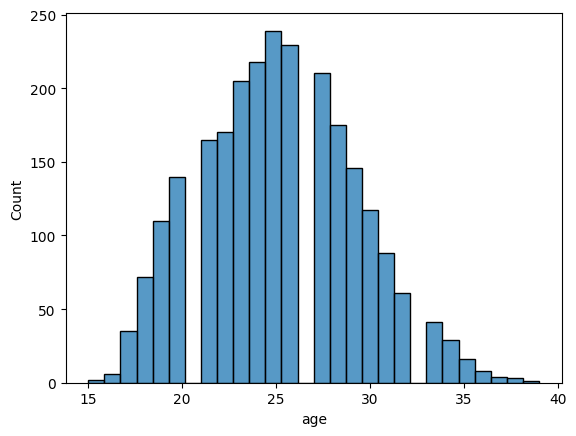

In [30]:
sns.histplot(df['age'])

<Axes: xlabel='info_position', ylabel='Count'>

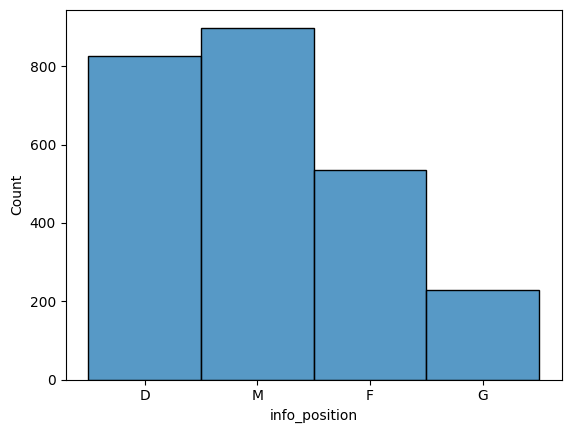

In [31]:
sns.histplot(df['info_position'])

In [32]:
#Топ 10 стран по количеству игроков в лиге
df.groupby(by='birth_country_country')['name_display'].count().sort_values(ascending=False).iloc[:10] 

birth_country_country
England        1060
France          171
Brazil          157
Spain            93
Portugal         88
Germany          70
Ireland          64
Netherlands      63
Belgium          63
Denmark          50
Name: name_display, dtype: int64

In [33]:
pd.set_option('display.max_rows', None)

In [34]:
df.iloc[:, 12:].corr()

,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
_accurate_back_zone_pass,1.000000,0.728114,0.105799,0.093666,0.611625,0.056168,0.554687,0.910278,0.029760,0.131336,0.161955,0.474967,0.560349,0.321493,0.558567,0.496355,0.079173,0.054432,-0.124999,0.095231,0.078873,-0.167825,0.356275,0.646481,-0.010716,0.120281,0.211498,-0.071934,0.273075,0.586806,0.031215,0.117386,-0.116558,0.404674,0.149674,0.448439,0.120281,0.650466,0.574530,0.695748,-0.145754,0.328215,0.828967,0.624113,0.512033,0.508778,0.260667,0.571827,0.633847,0.592534,0.430676,0.592534,0.821692,0.657616,0.839016,0.284339,0.551160,0.662783,0.638588,0.052226,0.046071,0.887910,0.622859,-0.136437,0.453377,0.449492,0.141709,0.151026,0.258222,0.405054,0.405091,0.008262,0.757605,0.562556,0.234691,0.814747,0.382257,0.897237,0.264173,-0.079278,0.066290,0.998226,0.727713,0.645945,-0.098623,0.079700,0.066758,0.426643,-0.173427,0.604180,0.211973,0.451904,-0.253398,0.899833,-0.013406,-0.023572,-0.160675,-0.251906,0.481951,0.064777,0.124169,0.821607,-0.075397,-0.087679,-0.087679,0.097836,-0.014510,0.521025,-0.051180,-0.078627,0.446463,0.351467,0.001575,0.149140
_accurate_chipped_pass,0.728114,1.000000,0.362925,0.306313,0.602383,0.110519,0.695850,0.749141,0.265153,0.155460,0.083097,0.279492,0.533822,0.366127,0.538659,0.494502,0.368603,0.256917,0.008577,0.361101,0.367322,0.025847,0.351287,0.679015,0.231996,0.133299,0.305024,0.141140,0.425967,0.521397,0.156689,0.376295,-0.001237,0.385891,0.165056,0.359317,0.133299,0.424417,0.345157,0.794632,-0.047466,0.330426,0.756728,0.619095,0.498860,0.494645,0.292138,0.343578,0.461856,0.516349,0.304181,0.516349,0.674985,0.636336,0.712371,0.268235,0.418556,0.631700,0.331659,0.328342,0.283087,0.746589,0.423816,-0.055817,0.447913,0.461960,0.043258,0.402513,0.242173,0.534207,0.534622,0.227594,0.633165,0.591780,0.310679,0.643147,0.468111,0.721988,0.339852,-0.050905,0.306628,0.737623,0.968356,0.421546,0.004046,0.333949,0.287017,0.546791,-0.103591,0.656966,0.253640,0.570691,-0.183777,0.781885,-0.006799,0.148882,-0.052960,-0.263546,0.448046,0.313171,0.148096,0.748339,-0.019096,-0.012962,-0.012962,0.132029,0.009770,0.

/home/chewye/.local/lib/python3.10/site-packages/seaborn/axisgrid.py:1280: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


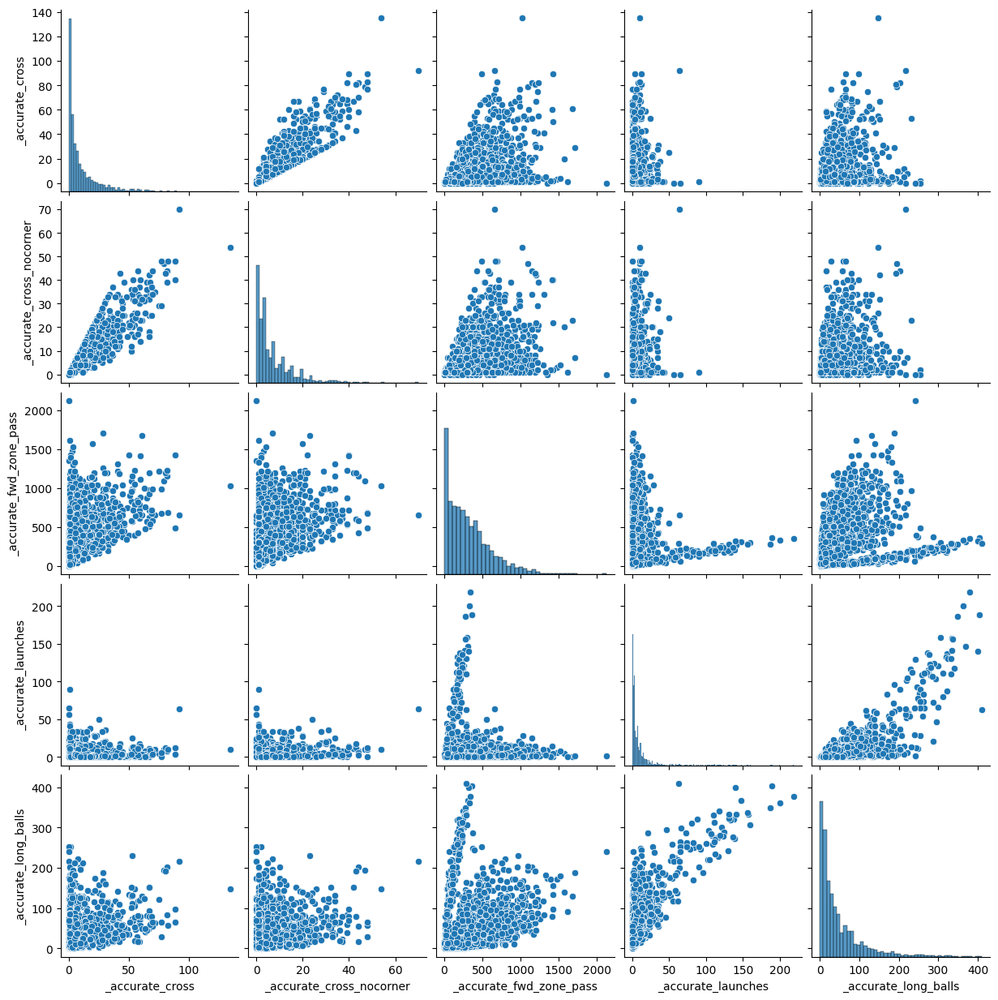

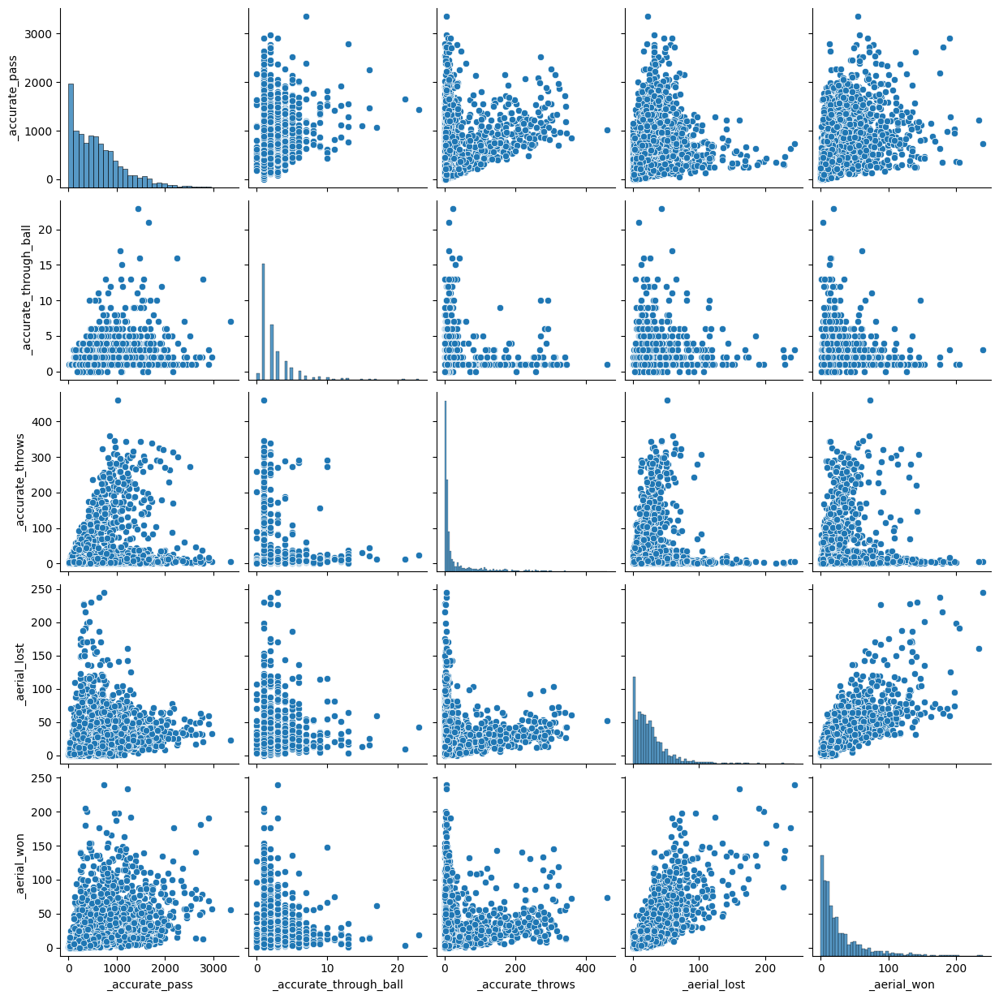

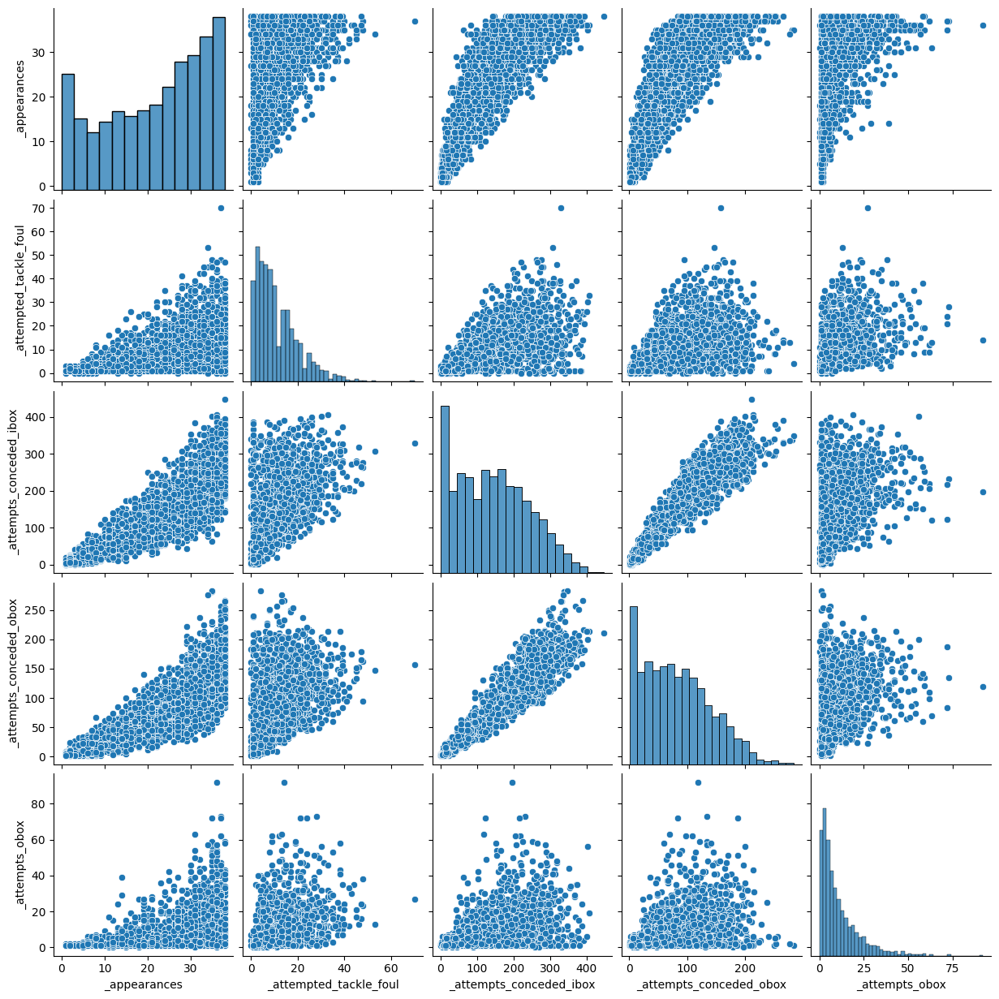

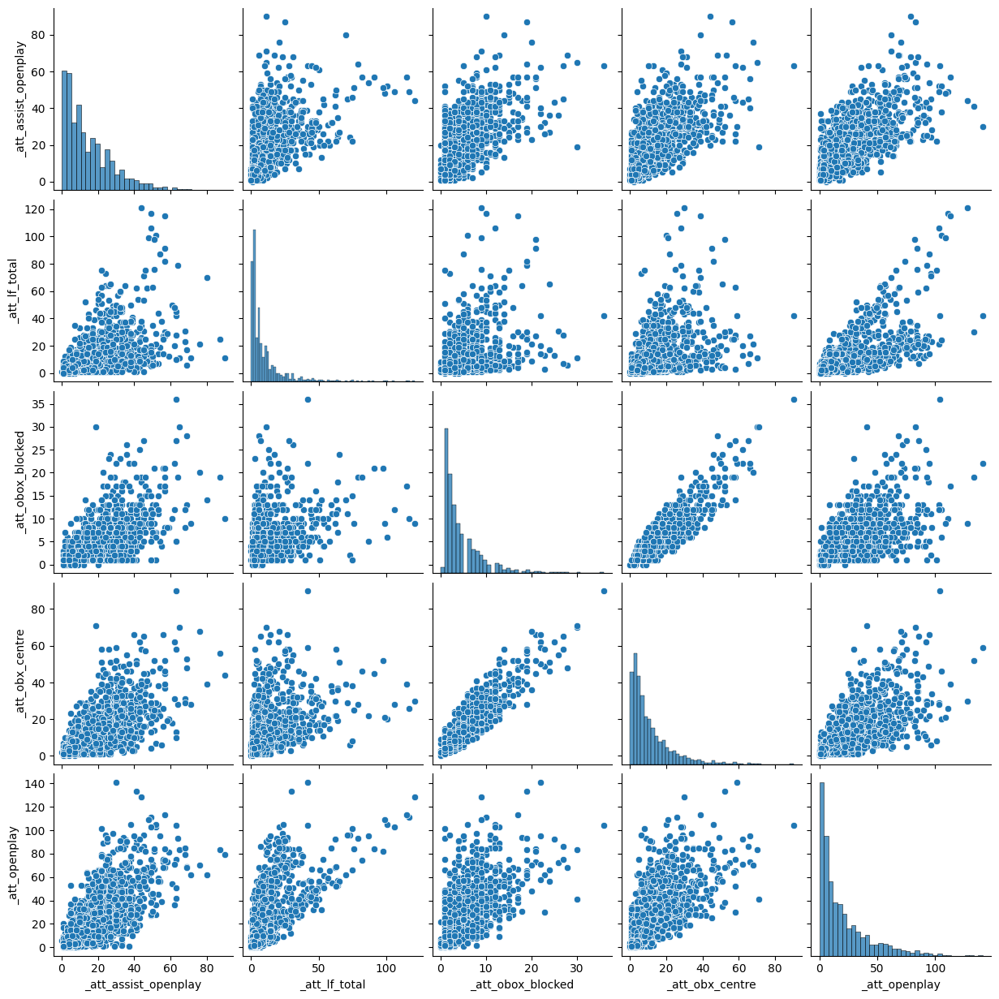

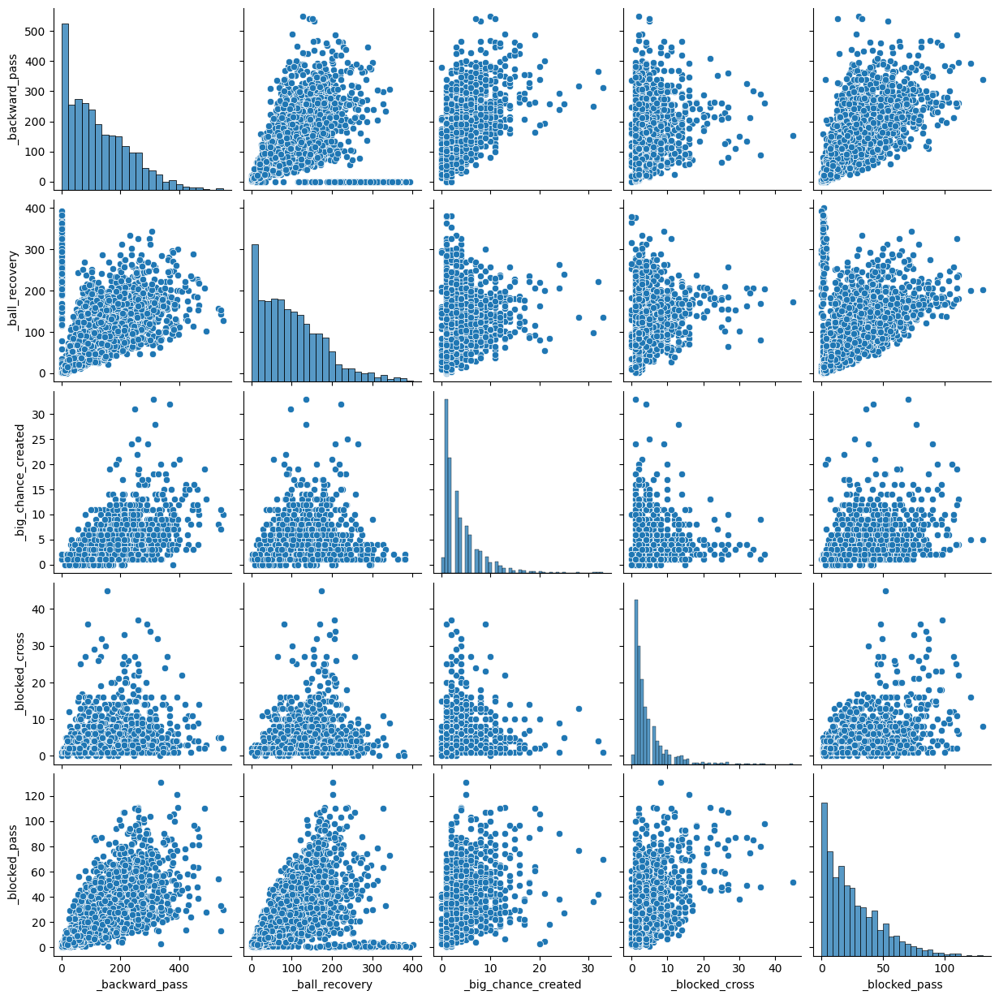

...

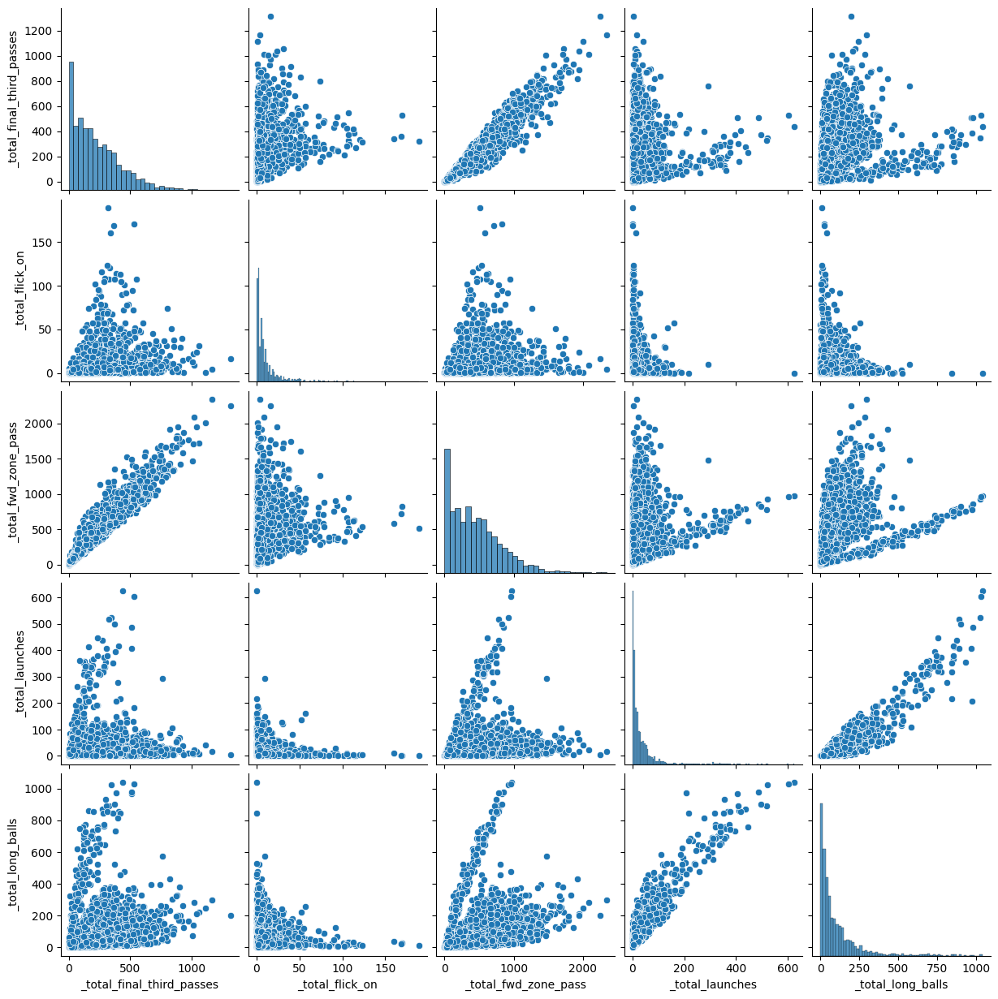

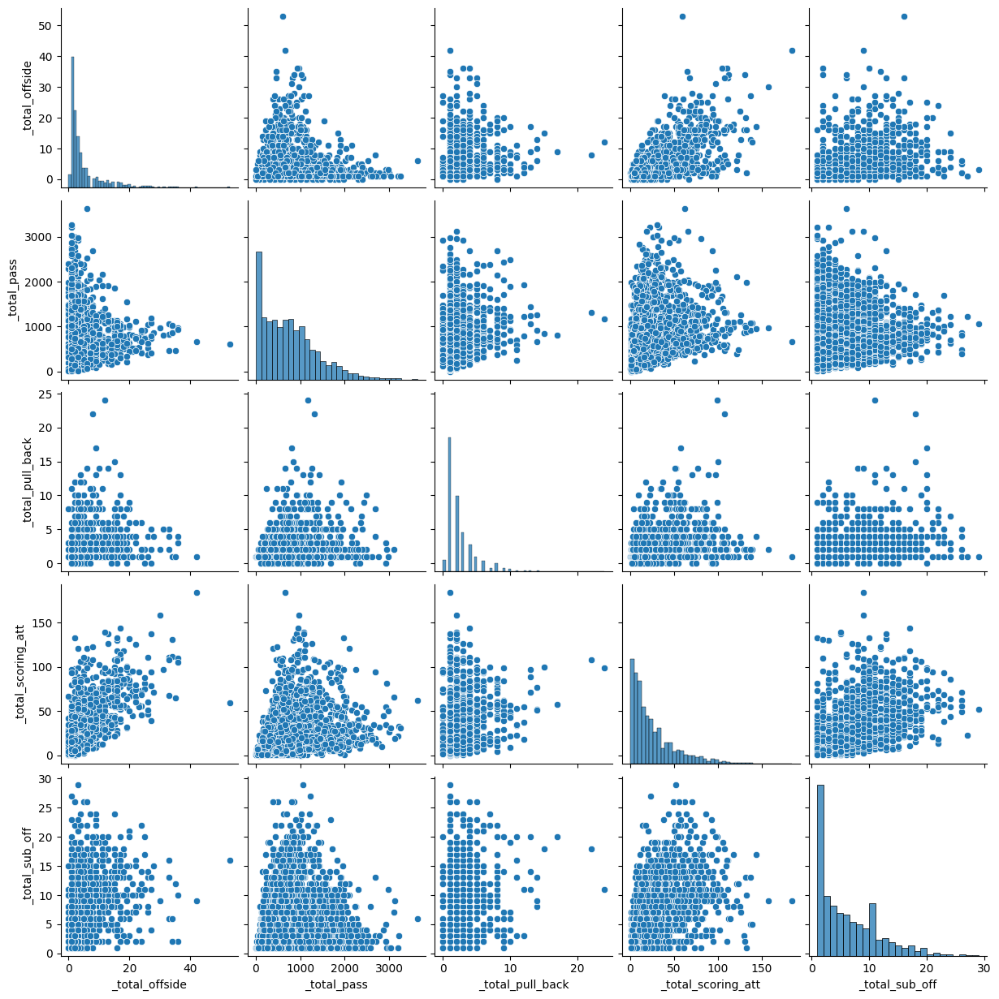

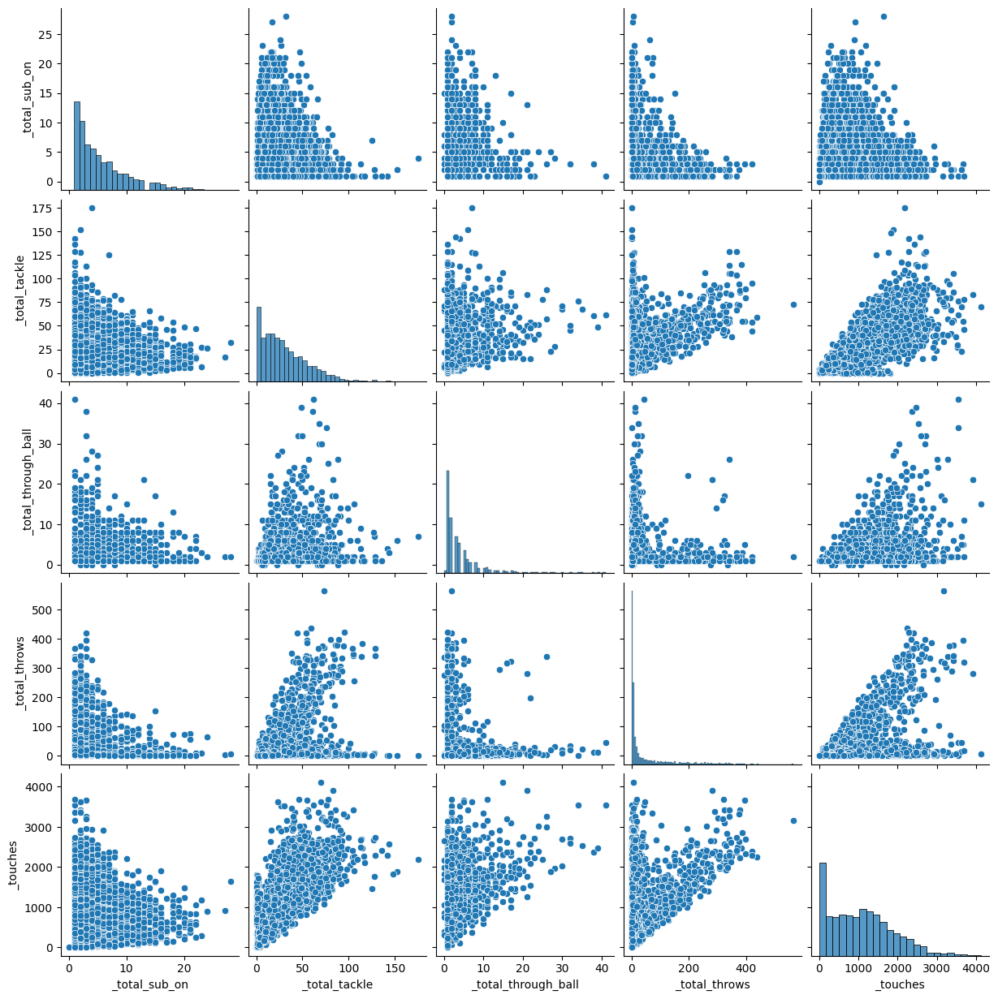

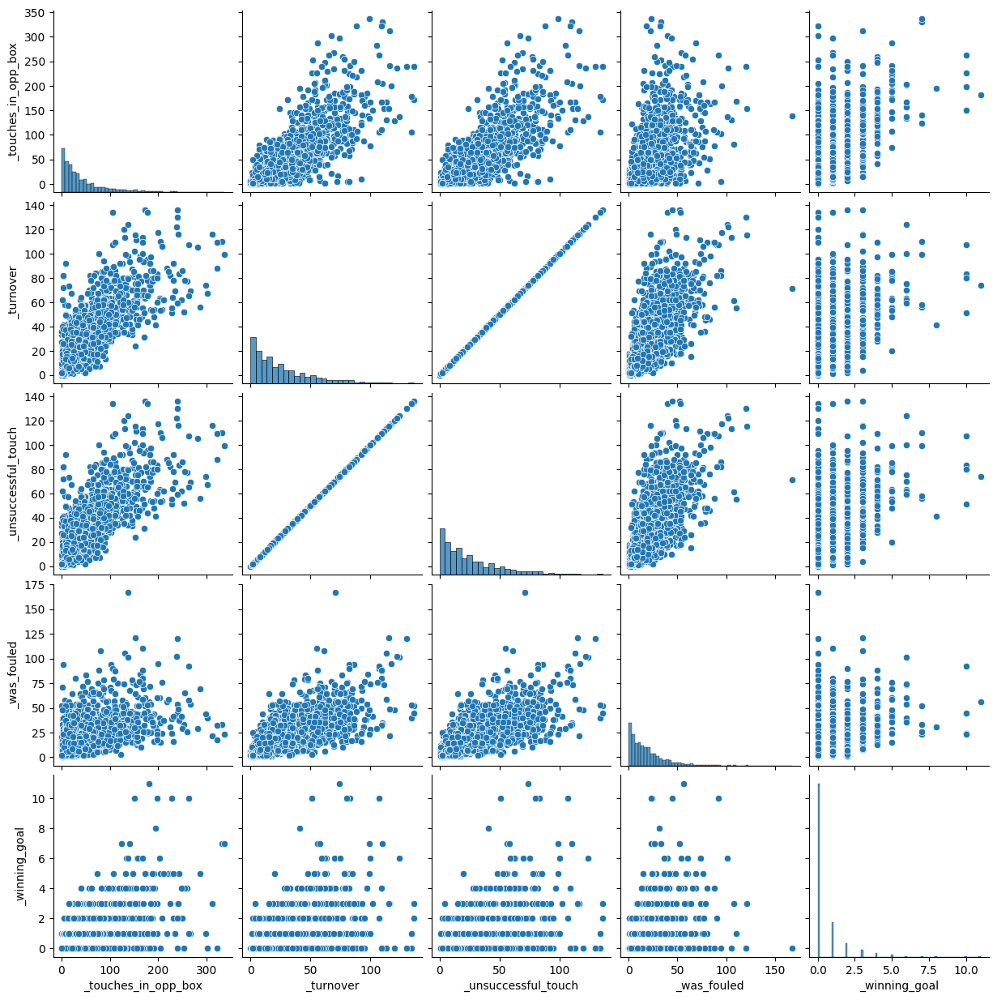

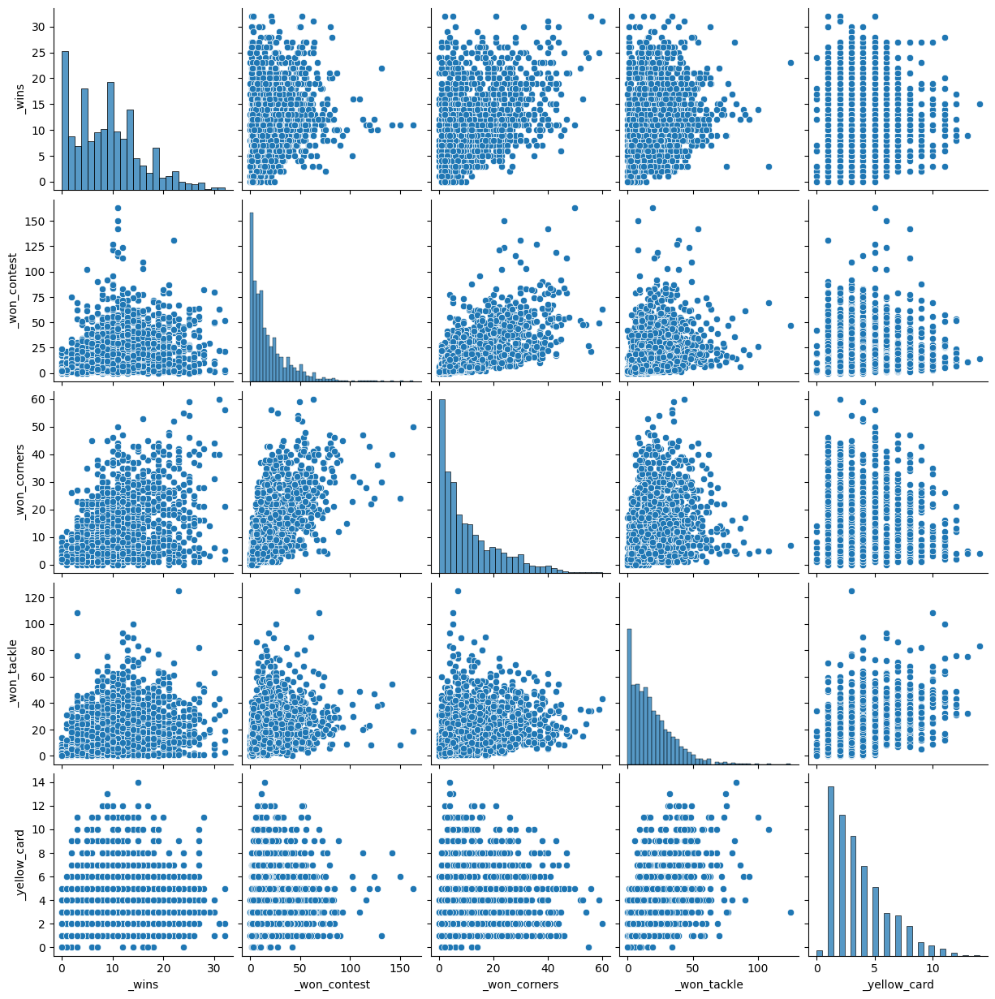

In [35]:
n = 5
df_new = df.iloc[:, 12:]
for col in range(2, df_new.shape[1]-n, n):
    loc_ =  list(range(col , col+n)) #Индексы колонок
    sns.pairplot(df_new.iloc[:, loc_])

In [36]:
df.to_csv(Path('eda_data/players_stat.csv').resolve(), index=False)